Your group is assigned a Wikipedia page on a conspiracy theory.

Task:
- Scrape the page to collect its main text.
- Use regex to extract any structured information you think is interesting, which could be:
  * Names of people or places
  * Years and timelines of events
  * Keywords or repeated phrases
- Create at least one visualization that summarizes what you found.

Be ready to share:
- What you extracted (regex examples)
- Your visualization


# Imports

In [25]:
import requests
from bs4 import BeautifulSoup
import re
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [8]:
url = 'https://en.wikipedia.org/wiki/John_F._Kennedy_assassination_conspiracy_theories'
headers = {
    "User-Agent": "MeTryingToGetPassTheRule/1.0"
}
page = requests.get(url, headers=headers)
soup = BeautifulSoup(page.text)
print(soup)

<!DOCTYPE html>

<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-menu-disabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-pinned-clientpref-1 skin-theme-clientpref-day vector-feature-navigation-update-disabled vector-sticky-header-enabled vector-toc-available skin-thumbsize-clientpref-standard" dir="ltr" lang="en">
<head>
<meta charset="utf-8"/>
<title>John F. Kennedy assassination conspiracy theories - Wikipedia</title>
<script>(function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-menu-disabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector

In [10]:
body = soup.find("div",id="bodyContent")
print(body.text[:1000])






From Wikipedia, the free encyclopedia


American political controversy
"Kennedy assassination conspiracy theories" redirects here. For conspiracy theories surrounding the assassination of John's brother Robert, see Robert F. Kennedy assassination conspiracy theories.


The Moorman photograph, taken a fraction of a second after Kennedy was fatally shot, has been a subject of intense scrutiny. Some conspiracy theories believe that Kennedy's assassin is visible in the background
The assassination of John F. Kennedy, the 35th president of the United States, on November 22, 1963, has spawned numerous conspiracy theories.[1] These theories allege the involvement of the Central Intelligence Agency (CIA), the Mafia, Vice President Lyndon B. Johnson, Cuban prime minister Fidel Castro, the KGB, or some combination of these individuals and entities.
Some conspiracy theories have alleged a coverup by parts of the American federal government, such as the original investigators within the Feder

In [14]:
section_keywords = dict()

In [23]:
skip_pattern = re.compile(r"^(\[\d+\]|\s*)$")
sections = body.find_all("section")
for section in sections:
    lines = [line.strip() for line in section.text.split("\n") if line.strip()]
    if not lines:
        continue
    
    key = lines[0]
    
    cleaned_hpls = [
        hpl.text.strip()
        for hpl in section.find_all("a")
        if not skip_pattern.match(hpl.text.strip())
    ]
    
    section_keywords[key] = cleaned_hpls

In [24]:
section_keywords

{'American political controversy': ['Robert F. Kennedy assassination conspiracy theories',
  'Moorman photograph',
  'Kennedy was fatally shot',
  'assassin',
  'background',
  'The assassination',
  'John F. Kennedy',
  'president of the United States',
  'conspiracy theories',
  'Central Intelligence Agency',
  'Mafia',
  'Lyndon B. Johnson',
  'Fidel Castro',
  'KGB',
  'American federal government',
  'Federal Bureau of Investigation',
  'Warren Commission',
  'Vincent Bugliosi'],
 'Background': ['J. Edgar Hoover',
  'Mr. Katzenbach',
  'Soviet',
  'Lyndon B. Johnson',
  'Nikita Khrushchev',
  'Fidel Castro',
  'Earl Warren',
  'Richard Russell Jr.',
  'Warren Commission',
  'Bill Moyers',
  'Iron Curtain'],
 'Public opinion': ['John C. McAdams',
  'conspiracy theorists',
  'debunkers',
  'Vincent Bugliosi',
  'Calvin Trillin',
  'The New Yorker',
  'Colin Kidd',
  'National Opinion Research Center',
  'Gallup',
  'Arthur Lehman Goodhart',
  'Alberta Law Review',
  'ABC News',
  'C

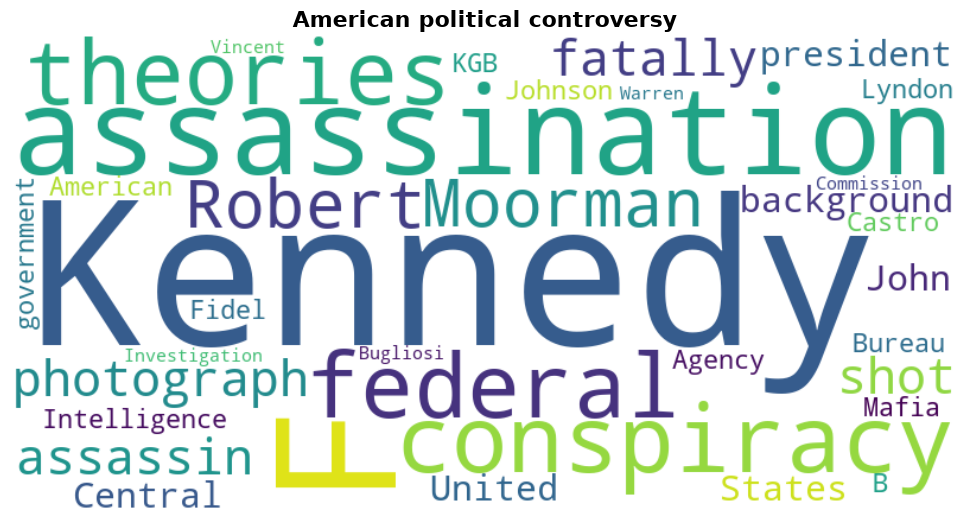

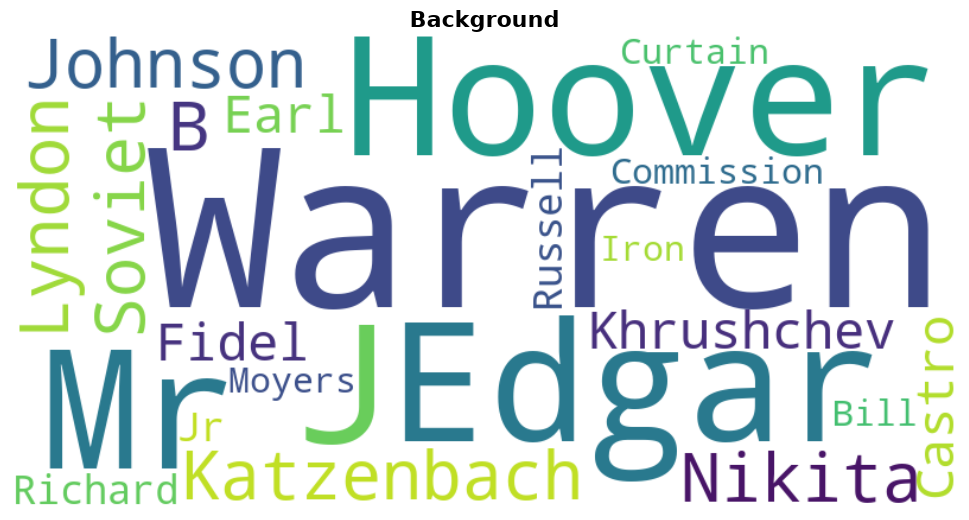

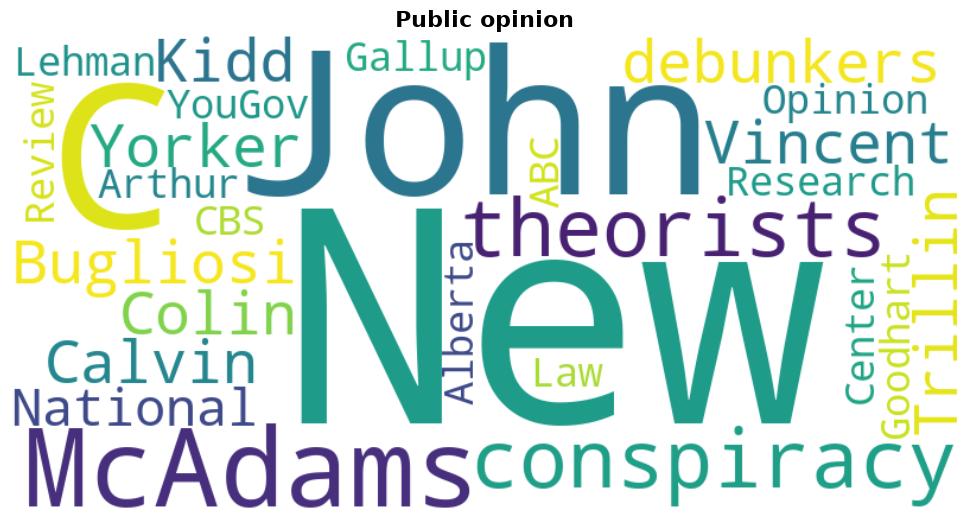

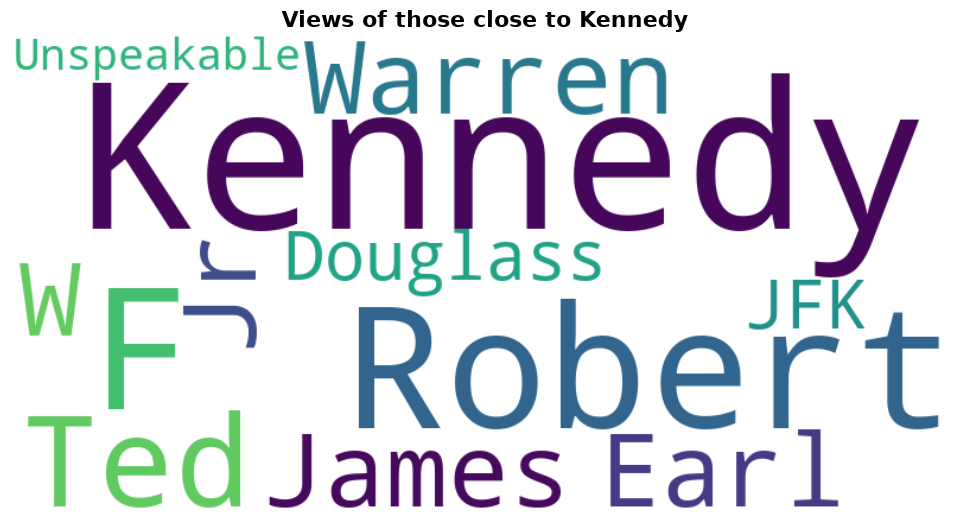

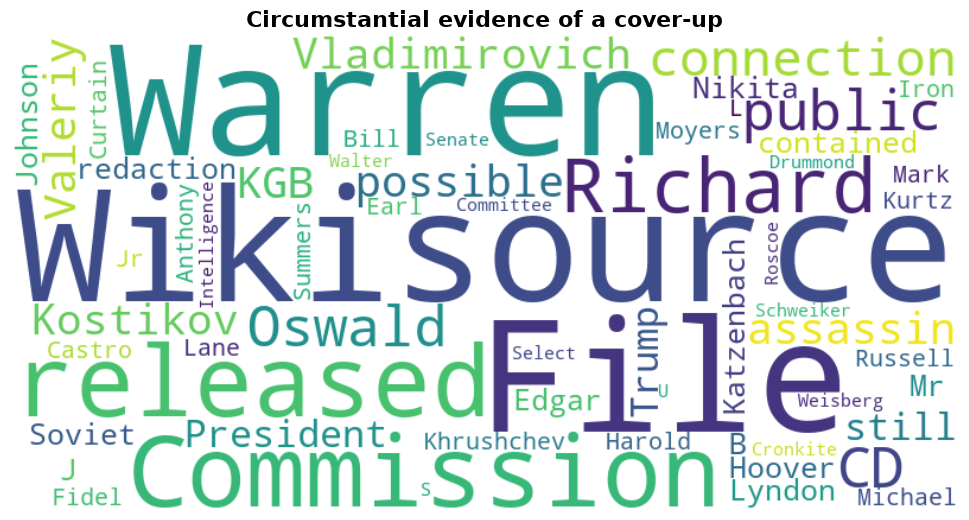

...

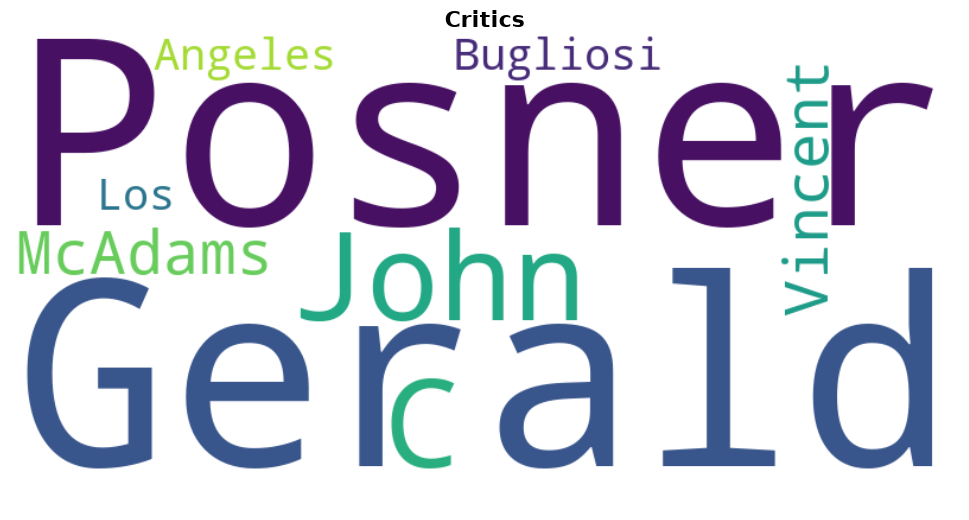

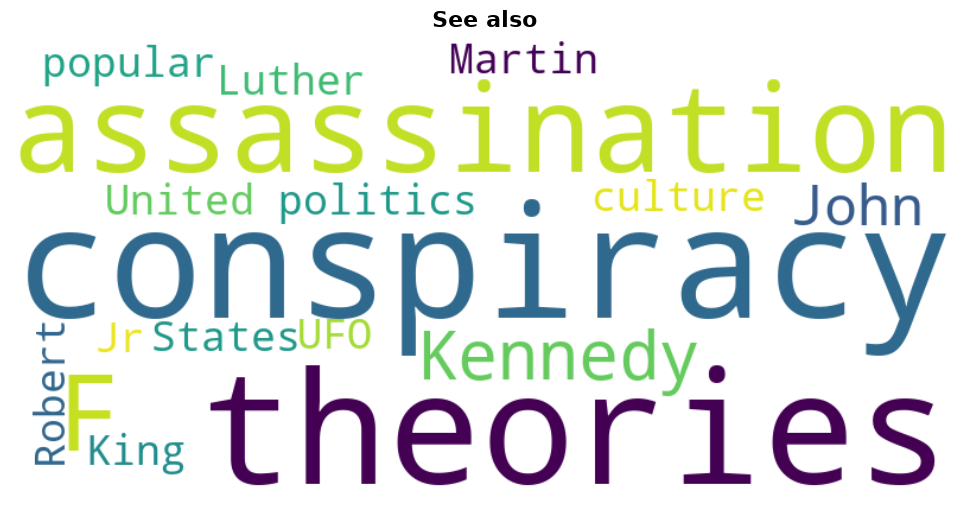

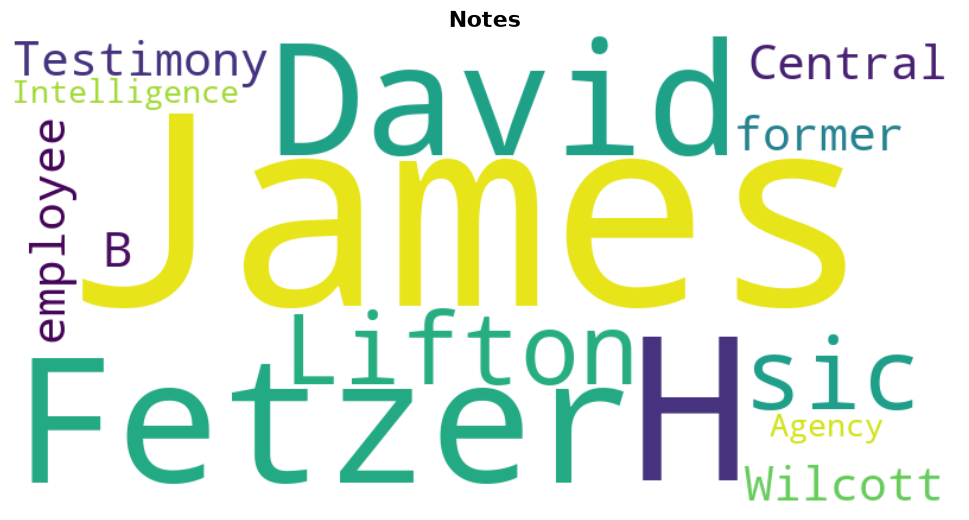

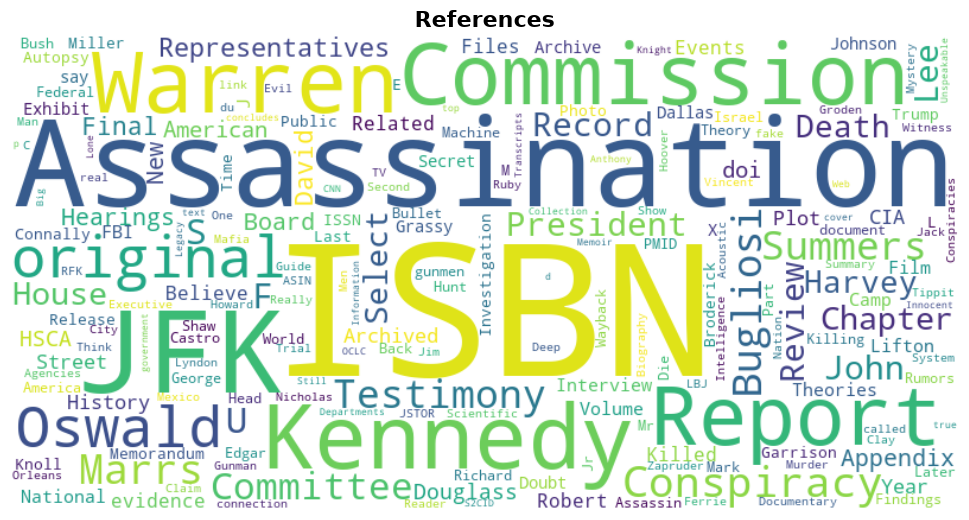

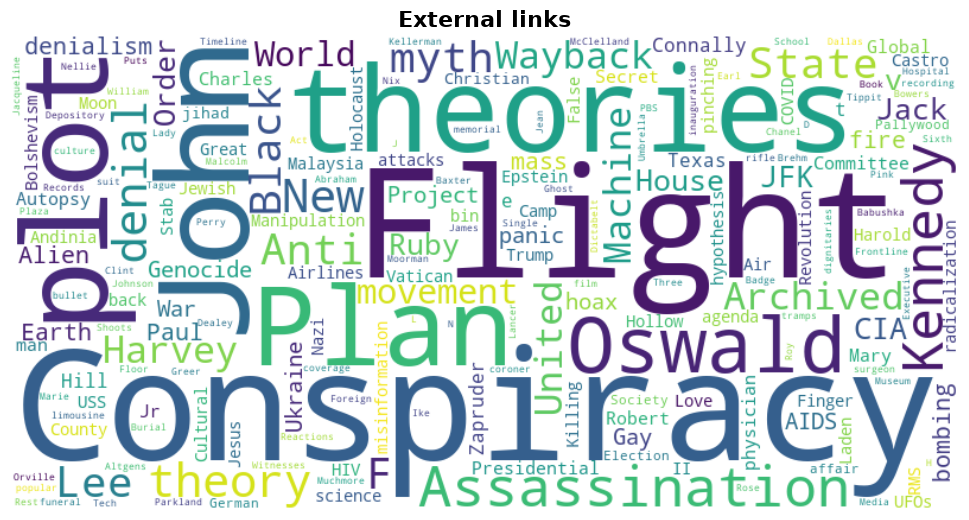

In [26]:
for section_title, keywords in section_keywords.items():
    # Skip if the section has no keywords
    if not keywords:
        continue

    # Join the keywords into a single string separated by spaces
    text_data = " ".join(keywords)

    # Generate the word cloud
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color="white",
        collocations=False,  # Set to False to prevent repeating word pairs
    ).generate(text_data)

    # Display the plot
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(section_title, fontsize=16, fontweight="bold")
    plt.tight_layout(pad=0)
    plt.show()